In [1]:
#We begin by estimating the unknown mass of the pendulum with only a measurement on the angle. We generate the data with the build-in do_mpc simulator for convenience, but we can do this from data,

In [2]:
#Run these lines if you need to install the libraries
!pip install casadi
!pip install do_mpc

In [3]:
import numpy as np
from casadi import *
import do_mpc

In [4]:
model_type = 'continuous' # Continuous model
model = do_mpc.model.Model(model_type)

phi = model.set_variable(var_type='_x', var_name='phi', shape=(1,1)) #The two state variables are the angular position and speed
#Task: set another scalar state variable called dphi and an input variable (type _u) called u
dphi = model.set_variable(var_type='_x', var_name='dphi', shape=(1,1))
u = model.set_variable(var_type='_u', var_name='u', shape=(1,1))

# State measurements: we measure only the angular position
phi_meas = model.set_meas('phi_meas', phi, meas_noise=True)

# Input measurements
u_meas = model.set_meas('u_meas', u, meas_noise=False)

g = 9.81 #For this type of constant we can hardcode the actual value
l = model.set_variable('parameter', 'l') #For other parameters we can pass them as variables
m = model.set_variable('parameter', 'm')

model.set_rhs('phi', dphi) #Right hand side (rhs) of the dynamics for the dynamical system
#Task: write the right-hand side for the speed dynamics, using the continuous pendulum equation
dphi_next = g*sin(phi)/l + u/(m*l*l)

model.set_rhs('dphi', dphi_next, process_noise = False)

model.setup()

In [5]:
mhe = do_mpc.estimator.MHE(model, ['m']) #We will use the MHE to estimate the mass

setup_mhe = {
    't_step': 0.1,
    'n_horizon': 10,
    'store_full_solution': True,
    'meas_from_data': True
}

mhe.set_param(**setup_mhe)

#Cost matrices
#Task: from the documentation, explain which part of the cost function these matrices weight
P_v = np.diag(np.array([1]))
P_x = np.array([[1,0],[0,2]]) #Cost matrix for the state. We emphasize estimating the unmeasured speed
P_p = np.eye(1) #Cost matrix for the unknown parameter

mhe.set_default_objective(P_x, P_v, P_p) #Set the objective

p_template_mhe = mhe.get_p_template() #we will need a template function. For the MHE it concerns only known parameters

def p_fun_mhe(t_now):
    p_template_mhe['l'] = 0.6
    return p_template_mhe

mhe.set_p_fun(p_fun_mhe)

mhe.bounds['lower','_u', 'u'] = -2 #Bounds for the input
mhe.bounds['upper','_u', 'u'] = 2

#Task: set bounds for the mass estimate (_p_est) so it is contained between 0.5 and 1.5
mhe.bounds['lower','_p_est', 'm'] = 0.5 #Bound for the unknown parameter
mhe.bounds['upper','_p_est', 'm'] = 1.5

mhe.setup()

In [6]:
simulator = do_mpc.simulator.Simulator(model)

simulator.set_param(t_step = 0.1) #Another way of setting parameters in do_mpc

p_template_sim = simulator.get_p_template()

#Task: create a parameter template which returns the length of 0.6m and the mass of 1kg (this template, for the simulator, has access to all the information on the system)
def p_fun_sim(t_now): #Here the template of the simulator also knows the mass as the simulator represents actual data
    p_template_sim['m'] = 1
    p_template_sim['l'] = 0.6
    return p_template_sim

simulator.set_p_fun(p_fun_sim)

simulator.setup()

In [7]:
#Task: explain what the variables x0, x0_mhe and p_est0 correspond to

x0 = np.pi*np.array([1, 0]).reshape(-1,1)

x0_mhe = x0*(1+0.5*np.random.randn(2,1))

simulator.x0 = x0
mhe.x0_mhe = x0_mhe
mhe.p_est0 = 1.3

mhe.set_initial_guess()

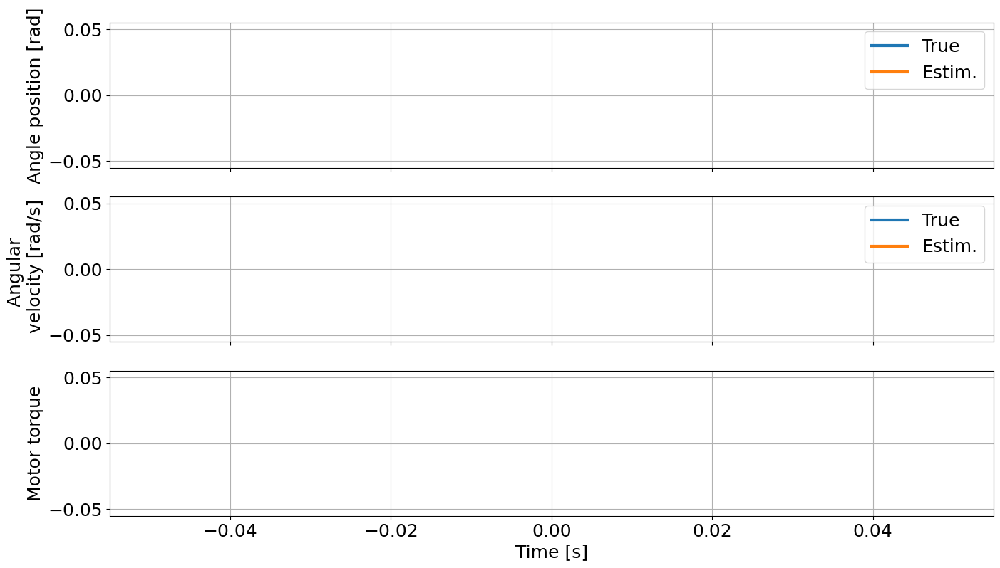

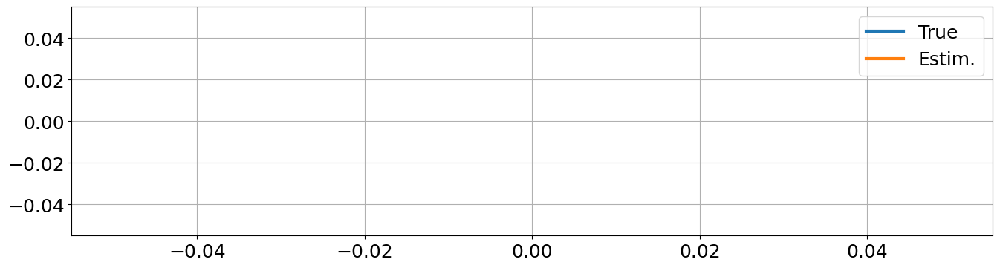

In [8]:
#do_mpc supports graphic analysis quite well. In this cell we prepare the graphs but don't plot anything yet, hence the empty graphs.

import matplotlib.pyplot as plt
import matplotlib as mpl
# Customizing Matplotlib:
mpl.rcParams['font.size'] = 18
mpl.rcParams['lines.linewidth'] = 3
mpl.rcParams['axes.grid'] = True

mhe_graphics = do_mpc.graphics.Graphics(mhe.data)
sim_graphics = do_mpc.graphics.Graphics(simulator.data)

#%%capture 
# We just want to create the plot and not show it right now
fig, ax = plt.subplots(3, sharex=True, figsize=(16,9))
fig.align_ylabels()

# We create another figure to plot the parameters:
fig_p, ax_p = plt.subplots(1, figsize=(16,4))

#%%capture
for g in [sim_graphics, mhe_graphics]:
    # Plot the state
    g.add_line(var_type='_x', var_name='phi', axis=ax[0])
    g.add_line(var_type='_x', var_name='dphi', axis=ax[1])

    # Plot the input
    g.add_line(var_type='_u', var_name='u', axis=ax[2])
    ax[2].set_prop_cycle(None)
    
    #Plot the mass estimate
    g.add_line(var_type='_p', var_name='m', axis=ax_p)


ax[0].set_ylabel('Angle position [rad]')
ax[1].set_ylabel('Angular \n velocity [rad/s]')
ax[2].set_ylabel('Motor torque')
ax[2].set_xlabel('Time [s]')


ax[0].legend(sim_graphics.result_lines['_x', 'phi']+mhe_graphics.result_lines['_x', 'phi'], ['True','Estim.'])
ax[1].legend(sim_graphics.result_lines['_x', 'dphi']+mhe_graphics.result_lines['_x', 'dphi'], ['True','Estim.'])

ax_p.legend(sim_graphics.result_lines['_p', 'm']+mhe_graphics.result_lines['_p', 'm'], ['True','Estim.'])

In [9]:
#Task: this function is a randomized input generator. Explain how the input is generated

def random_u(u0):
    # For the estimation we will use random inputs
    # Hold the current value with 80% chance or switch to new random value
    u_next = (0.5-np.random.rand(1,1))*np.pi # New candidate value.
    switch = np.random.rand() >= 0.8 # switching? 0 or 1.
    u0 = (1-switch)*u0 + switch*u_next # Old or new value.
    return u0

In [10]:
%%capture
np.random.seed(99)

u0 = np.zeros((1,1)) #Initial zero input
for i in range(50):
    #Task: Using the do-mpc documentation, fill-in the blanks
    u0 = random_u(u0) # Control input
    v0 = 0.1*np.random.randn(model.n_v,1) #Measurement noise
    y0 = simulator.make_step(u0, v0=v0)
    x0 = mhe.make_step(y0) # MHE estimation step

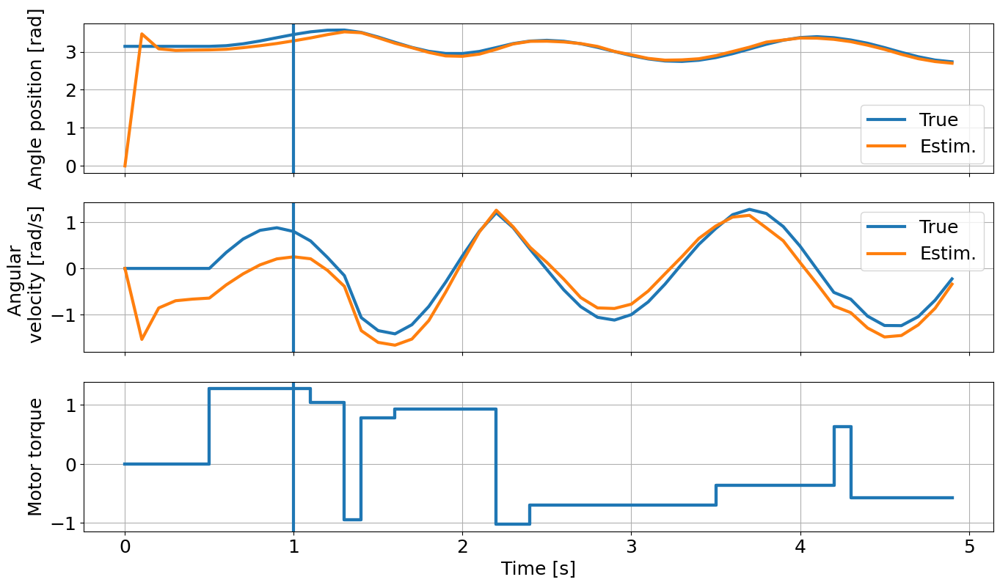

In [11]:
sim_graphics.plot_results()
mhe_graphics.plot_results()

mhe_graphics.reset_axes()

ax[0].axvline(1)
ax[1].axvline(1)
ax[2].axvline(1)

fig

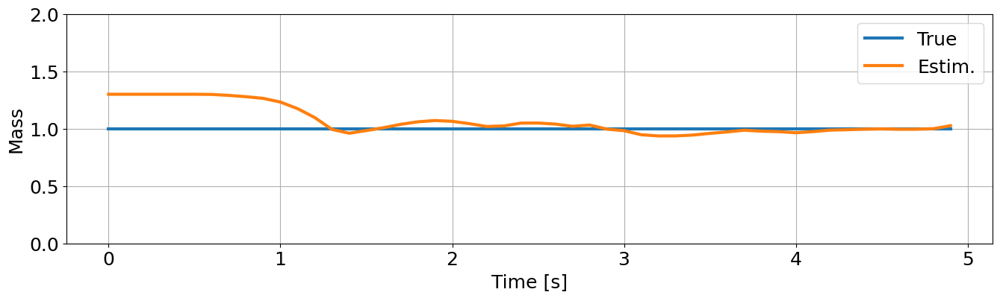

In [12]:
ax_p.set_ylim(0, 2)
ax_p.set_ylabel('Mass')
ax_p.set_xlabel('Time [s]')
fig_p

In [13]:
#We now have an estimate of the mass as 1kg. we will control a pendulum with an mpc controller

In [14]:
class Pendulum():
    def __init__(self):
        self.l = 0.6
        self.m = 1
        self.max_torque = 10
        self.max_speed = 8
        self.state = np.array([0,0])
        self.last_input = None
        self.g = 9.81
        self.dt = 0.1
        self.angle_std = 3*2*np.pi/360
        self.speed_std = 0.1
        
    def random_init(self):
        self.state = np.array([np.random.uniform(-np.pi, np.pi),np.random.uniform(-sefl.max_speed, self.max_speed)])
        
    def step(self, u):
        u = np.clip(u, -self.max_torque, self.max_torque)
        self.last_input = u
        accel = u/(self.m*self.l*self.l) + self.g*np.sin(self.state[0])/self.l
        speed = self.state[1]
        angle = self.state[0]
        
        new_speed = speed + accel*self.dt + np.random.normal(0,self.speed_std)
        new_speed = np.clip(new_speed, -self.max_speed, self.max_speed)
        
        new_angle = angle + new_speed*self.dt + np.random.normal(0,self.angle_std)
        if new_angle < -np.pi:
            new_angle = new_angle + 2*np.pi
        if new_angle > np.pi:
            new_angle = new_angle - 2*np.pi
        
        self.state = np.array([new_angle, new_speed])
        
    def set_state(self, angle, speed):
        speed = np.clip(speed, -self.max_speed, self.max_speed)
        if angle < -np.pi:
            angle = angle + 2*np.pi
        if angle > np.pi:
            angle = angle - 2*np.pi
        self.state = np.array([angle, speed])

        
P = Pendulum()

In [15]:
model2 = do_mpc.model.Model(model_type) #New model

#Task: set the two state variables for model 2, this time calling them theta and dtheta
theta = model2.set_variable(var_type='_x', var_name='theta', shape=(1,1))
dtheta = model2.set_variable(var_type='_x', var_name='dtheta', shape=(1,1))

u = model2.set_variable(var_type='_u', var_name='u', shape=(1,1))

m = P.m #This time we can directly use the values from the pendulum as we know them all.
l = P.l
g = P.g

model2.set_rhs('theta',dtheta)
model2.set_rhs('dtheta', g*sin(theta)/l + u/(m*l*l))

model2.setup()

In [16]:
mpc = do_mpc.controller.MPC(model2)

setup_mpc = {
    'n_horizon': 20,
    't_step': P.dt,
    'n_robust': 0,
    'store_full_solution': True,
}
mpc.set_param(**setup_mpc)

#Task: write the two terms of the cost as such:
#l_term: online cost. \theta^2 + 0.1*dtheta^2
#m_term: terminal cost. \theta^2 + 0.5*dtheta^2
l_term = theta*theta + 1*dtheta*dtheta #original values: 0.1 and 0.5
m_term = theta*theta + 5*dtheta*dtheta
mpc.set_objective(mterm=m_term, lterm=l_term) #Quadratic function for the MPC. Here we choose not to penalize input fluctuation, hence the warning as we setup the controller.

#Task: assign bounds to the mpc such that the input is between -2 and 2
mpc.bounds['lower','_u', 'u'] = -20 #Input bounds
mpc.bounds['upper','_u', 'u'] = 20

mpc.setup()

C:\Users\marco\anaconda3\lib\site-packages\do_mpc\controller\_mpc.py:909: UserWarning: rterm was not set and defaults to zero. Changes in the control inputs are not penalized. Can lead to oscillatory behavior.
  warnings.warn('rterm was not set and defaults to zero. Changes in the control inputs are not penalized. Can lead to oscillatory behavior.')


In [17]:
x0 = np.array([np.pi, 0]).reshape(-1,1)
mpc.x0 = x0

mpc.set_initial_guess()

#Checking that everything is fine by performing a test step
u0 = mpc.make_step(x0)

mpc.reset_history() #Clear history

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

In [18]:
#The following cells perform 10 simulations and plot the average history with the shaded area representing the std

nSims = 10
fullH = np.zeros((nSims,299))
uH = np.zeros((nSims,299))
nSteps = 300

for j in range(nSims):
    hist = [[0,0]]*nSteps
    uhist = [0]*nSteps

    P = Pendulum()
    P.set_state(np.pi,0)
    mpc.reset_history()
    for i in range(nSteps-1):
        state = P.state
        x0 = state.reshape(-1,1)
        #Task: make a MPC step
        u0 = mpc.make_step(x0)
        u = u0[0][0] 
        u = u - ((-2.5+u)%0.25) #Make the input discrete, ie crop the value to the nearest discrete bin
        P.step(u)
        hist[i+1] = state
        uhist[i] = u
    #Task: store the angle history in the appropriate section of fullH
    fullH[j] = [x[0] for x in hist[1:]]
    uH[j] = uhist[:299]

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

   5 7.2866631e-002 8.87e-017 2.10e-014  -8.6 1.70e-008  -5.9 1.00e+000 1.00e+000h  1

Number of Iterations....: 5

                                   (scaled)                 (unscaled)
Objective...............:  7.2866631106462451e-002   7.2866631106462451e-002
Dual infeasibility......:  2.0978482329118006e-014   2.0978482329118006e-014
Constraint violation....:  8.8687737709314263e-017   8.8687737709314263e-017
Complementarity.........:  2.5059051346354446e-009   2.5059051346354446e-009
Overall NLP error.......:  2.5059051346354446e-009   2.5059051346354446e-009


Number of objective function evaluations             = 6
Number of objective gradient evaluations             = 6
Number of equality constraint evaluations            = 6
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 6
Number of inequality constraint Jacobian evaluations = 0
Number of Lagrangian Hessian evaluations             = 5
Total CPU secs in IPOPT (w/

   2 4.8762290e-002 2.68e-006 2.88e-005  -1.7 1.33e-001  -4.5 1.00e+000 1.00e+000h  1
   3 4.8759395e-002 1.71e-009 4.24e-008  -3.8 3.82e-003  -5.0 1.00e+000 1.00e+000h  1
   4 4.8759395e-002 6.23e-015 3.17e-011  -5.7 8.56e-006  -5.4 1.00e+000 1.00e+000h  1
   5 4.8759395e-002 4.60e-017 1.91e-014  -8.6 1.54e-008  -5.9 1.00e+000 1.00e+000h  1

Number of Iterations....: 5

                                   (scaled)                 (unscaled)
Objective...............:  4.8759394910048992e-002   4.8759394910048992e-002
Dual infeasibility......:  1.9051712370029432e-014   1.9051712370029432e-014
Constraint violation....:  4.5970172113385388e-017   4.5970172113385388e-017
Complementarity.........:  2.5059049546552820e-009   2.5059049546552820e-009
Overall NLP error.......:  2.5059049546552820e-009   2.5059049546552820e-009


Number of objective function evaluations             = 6
Number of objective gradient evaluations             = 6
Number of equality constraint evaluations            =

   2 4.2885557e-002 3.85e-006 2.26e-005  -1.7 2.41e-001  -4.5 1.00e+000 1.00e+000h  1
   3 4.2877264e-002 2.35e-009 1.25e-007  -3.8 1.13e-002  -5.0 1.00e+000 1.00e+000h  1
   4 4.2877264e-002 6.48e-015 1.07e-010  -5.7 2.89e-005  -5.4 1.00e+000 1.00e+000h  1
   5 4.2877264e-002 3.56e-017 4.22e-014  -8.6 3.42e-008  -5.9 1.00e+000 1.00e+000h  1

Number of Iterations....: 5

                                   (scaled)                 (unscaled)
Objective...............:  4.2877264039217260e-002   4.2877264039217260e-002
Dual infeasibility......:  4.2173457822459628e-014   4.2173457822459628e-014
Constraint violation....:  3.5561831257524545e-017   3.5561831257524545e-017
Complementarity.........:  2.5059066636661915e-009   2.5059066636661915e-009
Overall NLP error.......:  2.5059066636661915e-009   2.5059066636661915e-009


Number of objective function evaluations             = 6
Number of objective gradient evaluations             = 6
Number of equality constraint evaluations            =

   4 5.2913166e-002 4.07e-013 1.95e-009  -3.8 5.26e-004  -5.4 1.00e+000 1.00e+000h  1
   5 5.2913166e-002 8.33e-017 5.09e-012  -5.7 4.12e-006  -5.9 1.00e+000 1.00e+000h  1
   6 5.2913166e-002 5.55e-017 2.02e-014  -8.6 4.90e-008  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  5.2913165805073221e-002   5.2913165805073221e-002
Dual infeasibility......:  2.0150217368808705e-014   2.0150217368808705e-014
Constraint violation....:  5.5511151231257827e-017   5.5511151231257827e-017
Complementarity.........:  2.5059080867609568e-009   2.5059080867609568e-009
Overall NLP error.......:  2.5059080867609568e-009   2.5059080867609568e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 7
Number of inequality constraint evaluations          = 0
Number of equality constra

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 7

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 6

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 4

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 5

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

   3 9.2819654e+000 2.29e-007 2.08e-006  -2.5 5.67e-003  -5.0 1.00e+000 1.00e+000h  1
   4 9.2819653e+000 5.17e-010 3.02e-009  -3.8 2.77e-004  -5.4 1.00e+000 1.00e+000h  1
   5 9.2819653e+000 1.33e-012 1.70e-011  -5.7 1.38e-005  -5.9 1.00e+000 1.00e+000h  1
   6 9.2819653e+000 7.22e-016 7.03e-014  -8.6 1.71e-007  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  9.2819653488284608e+000   9.2819653488284608e+000
Dual infeasibility......:  7.0250293738512768e-014   7.0250293738512768e-014
Constraint violation....:  7.2164496600635175e-016   7.2164496600635175e-016
Complementarity.........:  2.5059203782234679e-009   2.5059203782234679e-009
Overall NLP error.......:  2.5059203782234679e-009   2.5059203782234679e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            =

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 4

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

   6 1.2795072e-002 1.39e-017 1.07e-014  -8.6 2.59e-008  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  1.2795071897337116e-002   1.2795071897337116e-002
Dual infeasibility......:  1.0672212344767985e-014   1.0672212344767985e-014
Constraint violation....:  1.3877787807814457e-017   1.3877787807814457e-017
Complementarity.........:  2.5059059477890277e-009   2.5059059477890277e-009
Overall NLP error.......:  2.5059059477890277e-009   2.5059059477890277e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 7
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 7
Number of inequality constraint Jacobian evaluations = 0
Number of Lagrangian Hessian evaluations             = 6
Total CPU secs in IPOPT (w/

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 4.7706065e-001 1.47e-001 4.84e-012  -1.0 0.00e+000    -  0.00e+000 0.00e+000   0
   1 3.6506691e-001 2.45e-004 3.50e-003  -1.0 7.69e-001  -4.0 9.55e-001 1.00e+000h  1
   2 3.6275852e-001 1.65e-006 5.81e-005  -1.0 1.42e-001  -4.5 1.00e+000 1.00e+000h  1
   3 3.6275153e-001 5.58e-009 1.32e-007  -2.5 1.19e-002  -5.0 1.00e+000 1.00e+000h  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 4

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 6

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 4

   4 4.2112312e+001 1.88e-009 1.11e-008  -3.8 3.77e-004  -5.4 1.00e+000 1.00e+000h  1
   5 4.2112312e+001 5.65e-012 3.17e-011  -5.7 2.04e-005  -5.9 1.00e+000 1.00e+000h  1
   6 4.2112312e+001 1.86e-015 1.04e-013  -8.6 2.52e-007  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  4.2112312487226340e+001   4.2112312487226340e+001
Dual infeasibility......:  1.0388471411094035e-013   1.0388471411094035e-013
Constraint violation....:  1.8596235662471372e-015   1.8596235662471372e-015
Complementarity.........:  2.5059303091119866e-009   2.5059303091119866e-009
Overall NLP error.......:  2.5059303091119866e-009   2.5059303091119866e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 7
Number of inequality constraint evaluations          = 0
Number of equality constra

   4 1.0310599e+000 4.16e-011 9.45e-010  -3.8 2.55e-004  -5.4 1.00e+000 1.00e+000h  1
   5 1.0310599e+000 6.34e-014 6.34e-012  -5.7 5.14e-006  -5.9 1.00e+000 1.00e+000h  1
   6 1.0310599e+000 1.80e-016 2.61e-014  -8.6 6.35e-008  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  1.0310598608201174e+000   1.0310598608201174e+000
Dual infeasibility......:  2.6113408118012853e-014   2.6113408118012853e-014
Constraint violation....:  1.8041124150158794e-016   1.8041124150158794e-016
Complementarity.........:  2.5059095406731411e-009   2.5059095406731411e-009
Overall NLP error.......:  2.5059095406731411e-009   2.5059095406731411e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 7
Number of inequality constraint evaluations          = 0
Number of equality constra

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

   3 1.0174428e-001 1.21e-008 2.98e-007  -2.5 2.68e-002  -5.0 1.00e+000 1.00e+000h  1
   4 1.0174428e-001 1.11e-012 1.18e-009  -3.8 3.18e-004  -5.4 1.00e+000 1.00e+000h  1
   5 1.0174428e-001 8.81e-016 5.25e-012  -5.7 4.25e-006  -5.9 1.00e+000 1.00e+000h  1
   6 1.0174428e-001 8.33e-017 2.12e-014  -8.6 5.16e-008  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  1.0174427602028925e-001   1.0174427602028925e-001
Dual infeasibility......:  2.1222272519730321e-014   2.1222272519730321e-014
Constraint violation....:  8.3266726846886741e-017   8.3266726846886741e-017
Complementarity.........:  2.5059082134676765e-009   2.5059082134676765e-009
Overall NLP error.......:  2.5059082134676765e-009   2.5059082134676765e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            =

   4 1.7168653e-002 3.10e-013 1.02e-009  -3.8 2.77e-004  -5.4 1.00e+000 1.00e+000h  1
   5 1.7168653e-002 1.01e-016 1.83e-012  -5.7 1.48e-006  -5.9 1.00e+000 1.00e+000h  1
   6 1.7168653e-002 4.16e-017 7.32e-015  -8.6 1.78e-008  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  1.7168652928622755e-002   1.7168652928622755e-002
Dual infeasibility......:  7.3239372543324716e-015   7.3239372543324716e-015
Constraint violation....:  4.1633363423443370e-017   4.1633363423443370e-017
Complementarity.........:  2.5059052023800739e-009   2.5059052023800739e-009
Overall NLP error.......:  2.5059052023800739e-009   2.5059052023800739e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 7
Number of inequality constraint evaluations          = 0
Number of equality constra

   3 4.0959246e-002 1.69e-010 1.47e-008  -3.8 1.32e-003  -5.0 1.00e+000 1.00e+000h  1
   4 4.0959246e-002 6.59e-017 1.25e-011  -5.7 3.39e-006  -5.4 1.00e+000 1.00e+000h  1
   5 4.0959246e-002 5.12e-017 1.58e-014  -8.6 1.28e-008  -5.9 1.00e+000 1.00e+000h  1

Number of Iterations....: 5

                                   (scaled)                 (unscaled)
Objective...............:  4.0959245830292049e-002   4.0959245830292049e-002
Dual infeasibility......:  1.5786896309389611e-014   1.5786896309389611e-014
Constraint violation....:  5.1174342541315809e-017   5.1174342541315809e-017
Complementarity.........:  2.5059047430343403e-009   2.5059047430343403e-009
Overall NLP error.......:  2.5059047430343403e-009   2.5059047430343403e-009


Number of objective function evaluations             = 6
Number of objective gradient evaluations             = 6
Number of equality constraint evaluations            = 6
Number of inequality constraint evaluations          = 0
Number of equality constra

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 4

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 8

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 5

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

   3 4.4471364e-002 1.79e-008 7.41e-008  -2.5 6.67e-003  -5.0 1.00e+000 1.00e+000h  1
   4 4.4471362e-002 1.37e-012 2.27e-010  -3.8 6.12e-005  -5.4 1.00e+000 1.00e+000h  1
   5 4.4471362e-002 5.84e-016 1.34e-012  -5.7 1.08e-006  -5.9 1.00e+000 1.00e+000h  1
   6 4.4471362e-002 6.59e-017 5.47e-015  -8.6 1.33e-008  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  4.4471362417626503e-002   4.4471362417626503e-002
Dual infeasibility......:  5.4656163850535421e-015   5.4656163850535421e-015
Constraint violation....:  6.5919492087118670e-017   6.5919492087118670e-017
Complementarity.........:  2.5059047890217587e-009   2.5059047890217587e-009
Overall NLP error.......:  2.5059047890217587e-009   2.5059047890217587e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            =

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 9

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 6

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 7

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 8

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

   1 8.0147789e+000 2.24e-002 7.08e-002  -1.0 7.83e-001  -4.0 9.48e-001 1.00e+000f  1
   2 7.9919969e+000 2.07e-004 1.78e-003  -1.0 1.58e-001  -4.5 1.00e+000 1.00e+000h  1
   3 7.9920115e+000 3.18e-008 1.26e-007  -2.5 3.29e-003  -5.0 1.00e+000 1.00e+000h  1
   4 7.9920114e+000 3.20e-010 2.11e-009  -3.8 2.66e-004  -5.4 1.00e+000 1.00e+000h  1
   5 7.9920114e+000 1.10e-012 1.80e-011  -5.7 1.46e-005  -5.9 1.00e+000 1.00e+000h  1
   6 7.9920114e+000 6.66e-016 7.45e-014  -8.6 1.81e-007  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  7.9920114410471612e+000   7.9920114410471612e+000
Dual infeasibility......:  7.4450157979660753e-014   7.4450157979660753e-014
Constraint violation....:  6.6613381477509392e-016   6.6613381477509392e-016
Complementarity.........:  2.5059192654765994e-009   2.5059192654765994e-009
Overall NLP error.......:  2.5059192654765994e-009   2.5059192654765994e-00

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 8

   3 6.1090672e-002 1.65e-009 1.59e-007  -2.5 1.43e-002  -5.0 1.00e+000 1.00e+000h  1
   4 6.1090671e-002 2.65e-013 7.00e-010  -3.8 1.89e-004  -5.4 1.00e+000 1.00e+000h  1
   5 6.1090671e-002 4.66e-016 3.82e-012  -5.7 3.10e-006  -5.9 1.00e+000 1.00e+000h  1
   6 6.1090671e-002 5.55e-017 1.55e-014  -8.6 3.77e-008  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  6.1090670568380745e-002   6.1090670568380745e-002
Dual infeasibility......:  1.5525210231660833e-014   1.5525210231660833e-014
Constraint violation....:  5.5511151231257827e-017   5.5511151231257827e-017
Complementarity.........:  2.5059069781216758e-009   2.5059069781216758e-009
Overall NLP error.......:  2.5059069781216758e-009   2.5059069781216758e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            =

   6 1.1424010e-001 3.90e-017 2.17e-014  -8.6 5.27e-008  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  1.1424009537187829e-001   1.1424009537187829e-001
Dual infeasibility......:  2.1687583306275783e-014   2.1687583306275783e-014
Constraint violation....:  3.9031278209478160e-017   3.9031278209478160e-017
Complementarity.........:  2.5059085092401067e-009   2.5059085092401067e-009
Overall NLP error.......:  2.5059085092401067e-009   2.5059085092401067e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 7
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 7
Number of inequality constraint Jacobian evaluations = 0
Number of Lagrangian Hessian evaluations             = 6
Total CPU secs in IPOPT (w/

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

   2 1.7949921e+000 4.32e-006 4.45e-005  -1.7 5.30e-002  -4.5 1.00e+000 1.00e+000h  1
   3 1.7949907e+000 6.53e-009 3.32e-008  -3.8 1.92e-003  -5.0 1.00e+000 1.00e+000h  1
   4 1.7949907e+000 2.21e-013 3.48e-011  -5.7 9.39e-006  -5.4 1.00e+000 1.00e+000h  1
   5 1.7949907e+000 2.44e-016 1.02e-013  -8.6 8.28e-008  -5.9 1.00e+000 1.00e+000h  1

Number of Iterations....: 5

                                   (scaled)                 (unscaled)
Objective...............:  1.7949907320676972e+000   1.7949907320676972e+000
Dual infeasibility......:  1.0219985201026217e-013   1.0219985201026217e-013
Constraint violation....:  2.4372864837474140e-016   2.4372864837474140e-016
Complementarity.........:  2.5059114148578315e-009   2.5059114148578315e-009
Overall NLP error.......:  2.5059114148578315e-009   2.5059114148578315e-009


Number of objective function evaluations             = 6
Number of objective gradient evaluations             = 6
Number of equality constraint evaluations            =

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

   5 5.6266582e+001 6.49e-012 3.64e-011  -5.7 2.04e-005  -5.9 1.00e+000 1.00e+000h  1
   6 5.6266582e+001 1.51e-015 1.04e-013  -8.6 2.53e-007  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  5.6266581943007537e+001   5.6266581943007537e+001
Dual infeasibility......:  1.0399370263435695e-013   1.0399370263435695e-013
Constraint violation....:  1.5126788710517758e-015   1.5126788710517758e-015
Complementarity.........:  2.5059308622270344e-009   2.5059308622270344e-009
Overall NLP error.......:  2.5059308622270344e-009   2.5059308622270344e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 7
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 7
Number of inequality constraint Jacobian evaluations = 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 4

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 8

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 5

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 6

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 4

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 6

   5 8.9370395e-001 4.45e-014 9.79e-012  -5.7 7.93e-006  -5.9 1.00e+000 1.00e+000h  1
   6 8.9370395e-001 1.96e-016 4.03e-014  -8.6 9.79e-008  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  8.9370394565670308e-001   8.9370394565670308e-001
Dual infeasibility......:  4.0305135783709561e-014   4.0305135783709561e-014
Constraint violation....:  1.9602375278537920e-016   1.9602375278537920e-016
Complementarity.........:  2.5059122837732331e-009   2.5059122837732331e-009
Overall NLP error.......:  2.5059122837732331e-009   2.5059122837732331e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 7
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 7
Number of inequality constraint Jacobian evaluations = 

   3 5.6945226e-001 6.14e-009 8.53e-008  -3.8 7.67e-003  -5.0 1.00e+000 1.00e+000h  1
   4 5.6945226e-001 6.91e-014 7.31e-011  -5.7 1.97e-005  -5.4 1.00e+000 1.00e+000h  1
   5 5.6945226e-001 1.89e-016 7.11e-014  -8.6 5.76e-008  -5.9 1.00e+000 1.00e+000h  1

Number of Iterations....: 5

                                   (scaled)                 (unscaled)
Objective...............:  5.6945226140277438e-001   5.6945226140277438e-001
Dual infeasibility......:  7.1102605342154798e-014   7.1102605342154798e-014
Constraint violation....:  1.8908485888147197e-016   1.8908485888147197e-016
Complementarity.........:  2.5059085787165924e-009   2.5059085787165924e-009
Overall NLP error.......:  2.5059085787165924e-009   2.5059085787165924e-009


Number of objective function evaluations             = 6
Number of objective gradient evaluations             = 6
Number of equality constraint evaluations            = 6
Number of inequality constraint evaluations          = 0
Number of equality constra

NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1.3512572e-001 6.87e-002 2.58e-012  -1.0 0.00e+000    -  0.00e+00

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 5

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 6

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 4

   1 4.7671342e+001 1.09e-002 5.08e-002  -1.0 1.06e+000  -4.0 9.50e-001 1.00e+000f  1
   2 4.7651287e+001 2.38e-004 1.71e-003  -1.0 3.20e-001  -4.5 1.00e+000 1.00e+000h  1
   3 4.7651258e+001 1.00e-006 8.02e-006  -2.5 2.69e-002  -5.0 1.00e+000 1.00e+000h  1
   4 4.7651258e+001 2.05e-009 1.18e-008  -3.8 3.84e-004  -5.4 1.00e+000 1.00e+000h  1
   5 4.7651258e+001 5.95e-012 3.33e-011  -5.7 2.03e-005  -5.9 1.00e+000 1.00e+000h  1
   6 4.7651258e+001 1.61e-015 1.04e-013  -8.6 2.52e-007  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  4.7651257612736394e+001   4.7651257612736394e+001
Dual infeasibility......:  1.0364859343308851e-013   1.0364859343308851e-013
Constraint violation....:  1.6098233857064770e-015   1.6098233857064770e-015
Complementarity.........:  2.5059305010011673e-009   2.5059305010011673e-009
Overall NLP error.......:  2.5059305010011673e-009   2.5059305010011673e-00

   5 1.0937506e-001 2.27e-015 2.09e-012  -5.7 1.70e-006  -5.9 1.00e+000 1.00e+000h  1
   6 1.0937506e-001 6.94e-017 8.61e-015  -8.6 2.09e-008  -6.4 1.00e+000 1.00e+000h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:  1.0937506417523679e-001   1.0937506417523679e-001
Dual infeasibility......:  8.6077973347588804e-015   8.6077973347588804e-015
Constraint violation....:  6.9388939039072284e-017   6.9388939039072284e-017
Complementarity.........:  2.5059055009750821e-009   2.5059055009750821e-009
Overall NLP error.......:  2.5059055009750821e-009   2.5059055009750821e-009


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 7
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 7
Number of inequality constraint Jacobian evaluations = 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 5

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 6

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

   1 1.9591717e+001 2.53e-002 1.98e-002  -1.0 2.65e-001  -4.0 9.80e-001 1.00e+000f  1
   2 1.9570676e+001 2.37e-004 1.56e-003  -1.7 1.30e-001  -4.5 1.00e+000 1.00e+000h  1
   3 1.9570702e+001 6.67e-008 1.67e-007  -3.8 4.70e-003  -5.0 1.00e+000 1.00e+000h  1
   4 1.9570702e+001 1.92e-012 4.85e-011  -5.7 1.31e-005  -5.4 1.00e+000 1.00e+000h  1
   5 1.9570702e+001 9.99e-016 2.72e-013  -8.6 2.20e-007  -5.9 1.00e+000 1.00e+000h  1

Number of Iterations....: 5

                                   (scaled)                 (unscaled)
Objective...............:  1.9570702448730014e+001   1.9570702448730014e+001
Dual infeasibility......:  2.7193837772510899e-013   2.7193837772510899e-013
Constraint violation....:  9.9920072216264089e-016   9.9920072216264089e-016
Complementarity.........:  2.5059259234247298e-009   2.5059259234247298e-009
Overall NLP error.......:  2.5059259234247298e-009   2.5059259234247298e-009


Number of objective function evaluations             = 6
Number of objective gradi

   4 1.4501465e-001 7.26e-015 4.13e-011  -5.7 1.12e-005  -5.4 1.00e+000 1.00e+000h  1
   5 1.4501465e-001 6.77e-017 2.95e-014  -8.6 2.39e-008  -5.9 1.00e+000 1.00e+000h  1

Number of Iterations....: 5

                                   (scaled)                 (unscaled)
Objective...............:  1.4501465003557448e-001   1.4501465003557448e-001
Dual infeasibility......:  2.9450961769804488e-014   2.9450961769804488e-014
Constraint violation....:  6.7654215563095477e-017   6.7654215563095477e-017
Complementarity.........:  2.5059057762783179e-009   2.5059057762783179e-009
Overall NLP error.......:  2.5059057762783179e-009   2.5059057762783179e-009


Number of objective function evaluations             = 6
Number of objective gradient evaluations             = 6
Number of equality constraint evaluations            = 6
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 6
Number of inequality constraint Jacobian evaluations = 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 7

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 6

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 2

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 3

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 6

   2 3.4025728e-001 1.06e-005 9.86e-005  -1.7 1.76e-001  -4.5 1.00e+000 1.00e+000h  1
   3 3.4025538e-001 2.14e-009 5.39e-008  -3.8 4.85e-003  -5.0 1.00e+000 1.00e+000h  1
   4 3.4025538e-001 2.15e-015 4.55e-011  -5.7 1.23e-005  -5.4 1.00e+000 1.00e+000h  1
   5 3.4025538e-001 1.67e-016 4.54e-014  -8.6 3.68e-008  -5.9 1.00e+000 1.00e+000h  1

Number of Iterations....: 5

                                   (scaled)                 (unscaled)
Objective...............:  3.4025538178042675e-001   3.4025538178042675e-001
Dual infeasibility......:  4.5394090751981423e-014   4.5394090751981423e-014
Constraint violation....:  1.6653345369377348e-016   1.6653345369377348e-016
Complementarity.........:  2.5059069916665387e-009   2.5059069916665387e-009
Overall NLP error.......:  2.5059069916665387e-009   2.5059069916665387e-009


Number of objective function evaluations             = 6
Number of objective gradient evaluations             = 6
Number of equality constraint evaluations            =

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 5.1943408e-001 2.79e-001 5.71e-012  -1.0 0.00e+000    -  0.00e+000 0.00e+000   0
   1 1.0977587e+000 2.28e-003 2.52e-002  -1.0 1.79e+000  -4.0 9.16e-001 1.00e+000h  1
   2 1.0845524e+000 2.06e-005 4.63e-004  -1.0 2.81e-001  -4.5 1.00e+000 1.00e+000h  1
   3 1.0843955e+000 2.70e-007 1.06e-006  -2.5 4.54e-002  -5.0 1.00e+000 1.00e+000h  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 4

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 1

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 5

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 6

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:      522
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:       82

Total number of variables............................:      188
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       20
                     variables with only upper bounds:        0
Total number of equality constraints.................:      162
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 5

Text(0, 0.5, 'Control input')

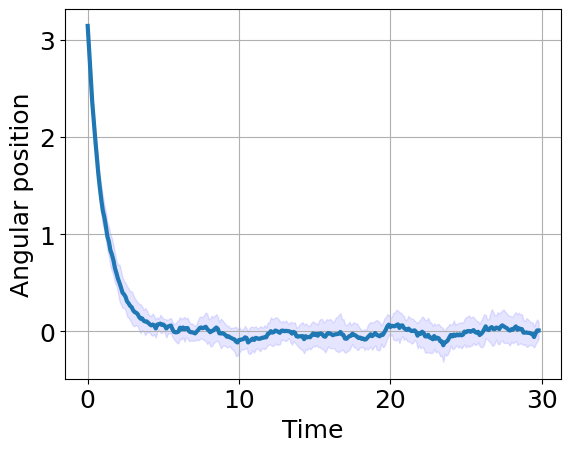

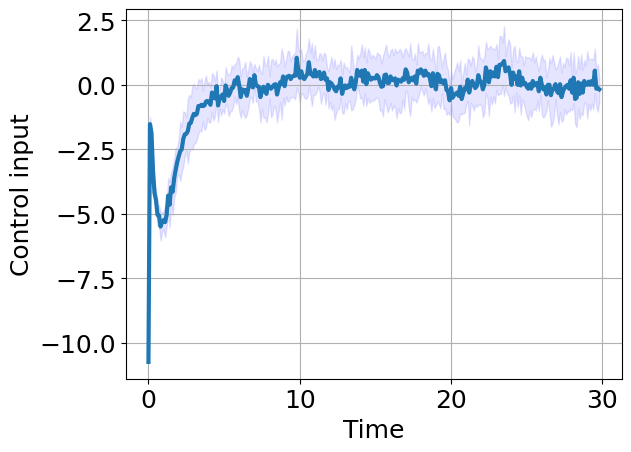

In [19]:
means = [0]*299
stds = [0]*299
for i in range(299):
    means[i] = np.mean(fullH[:,i])
    stds[i] = np.std(fullH[:,i])

x = np.array([x/10 for x in range(299)])
y = np.array(means)
ci = np.array(stds)

fig, ax = plt.subplots()
ax.plot(x,y)
ax.fill_between(x, (y-ci), (y+ci), color='b', alpha=.1)
ax.set_xlabel('Time')
ax.set_ylabel('Angular position')

umeans = [0]*299
ustds = [0]*299
for i in range(299):
    umeans[i] = np.mean(uH[:,i])
    ustds[i] = np.std(uH[:,i])

from matplotlib import pyplot as plt

x = np.array([x/10 for x in range(299)])
y = np.array(umeans)
ci = np.array(ustds)

fig, ax = plt.subplots()
ax.plot(x,y)
ax.fill_between(x, (y-ci), (y+ci), color='b', alpha=.1)
ax.set_xlabel('Time')
ax.set_ylabel('Control input')